# Remove duplicates (for JPG banners)

References:
-   code to download images from Steam: `download_steam_banners.ipynb` in [`woctezuma/google-colab`][code]
-   code to filter out images (duplicates, etc.): `remove_duplicates.ipynb` in [`woctezuma/google-colab`][code]
-   image data stored on Google Drive: [`woctezuma/download-steam-banners-data`][images]

[code]: <https://github.com/woctezuma/google-colab>
[images]: <https://github.com/woctezuma/download-steam-banners-data>

## Install

You must restart the runtime in order to use newly installed versions of `[PIL,numpy]`.

In [ ]:
%pip install google-colab-transfer imagededup

## Set global parameters

In [ ]:
file_name = 'original_vertical_steam_banners.tar'

In [ ]:
output_archive_name = 'filtered_vertical_steam_banners.tar'

In [157]:
output_resized_folder = 'resized_vertical_steam_banners'

In [ ]:
image_size = [300, 450]

In [ ]:
def get_gdrive_data_folder():
  gdrive_data_folder = 'data/'

  return gdrive_data_folder

In [ ]:
def get_local_data_folder():
  local_data_folder = 'data/original_vertical_steam_banners/'

  return local_data_folder

In [ ]:
def get_image_root_name():
  image_root_name = 'library_600x900'

  return image_root_name 

In [ ]:
def get_image_extension():
  image_extension = '.jpg'

  return image_extension

## Import data

In [ ]:
import colab_transfer

colab_transfer.mount_google_drive()

gd = colab_transfer.get_path_to_home_of_google_drive()
lm = colab_transfer.get_path_to_home_of_local_machine()

Mounted at /content/drive/


In [ ]:
colab_transfer.copy_file(file_name,
                         source = gd + get_gdrive_data_folder(),
                         destination = lm)

Copying /content/drive/My Drive/data/original_vertical_steam_banners.tar to /content/original_vertical_steam_banners.tar


In [ ]:
%cd /content/

!echo tar -xf {file_name}
!tar -xf {file_name}

/content
tar -xf original_vertical_steam_banners.tar


## Boilerplate functions

In [ ]:
def get_kb_size():
  kb_size = 1024

  return kb_size

### Parsing utils

In [ ]:
from pathlib import Path

def get_app_id(file_name, image_extension=None):
  if image_extension is None:
    image_extension = get_image_extension()

  app_id = Path(file_name).name.replace(image_extension, '')

  return app_id

In [ ]:
def get_url(file_name=None,
            app_id=None):
  if app_id is None:
    app_id = get_app_id(file_name)

  url = 'https://cdn.cloudflare.steamstatic.com/steam/apps/{}/{}{}'.format(app_id,
                                                                           get_image_root_name(),
                                                                           get_image_extension())

  return url

### Disk utils

In [ ]:
import glob
import os

def list_file_names(image_dir=None,
                    file_ext=None):
  if file_ext is None:
    file_ext = get_image_extension()

  if image_dir is None:
    image_dir = get_local_data_folder()

  if not image_dir.endswith('/'):
    image_dir += '/'

  file_names = glob.glob(image_dir + '*' + file_ext)

  file_names = sorted(file_names, key=lambda f: os.path.getsize(f))

  return file_names

In [ ]:
def save_app_ids_to_file(output_file_name, 
                         image_dir = None):
  file_names = list_file_names(image_dir)

  app_ids = [
            str(get_app_id(f)) for f in file_names
  ]

  app_ids = sorted(app_ids, key=int)

  print('#appIDs = {}'.format(len(app_ids)))

  with open(output_file_name, 'w') as f:
    f.write('\n'.join(app_ids))

  return

### Display utils

In [ ]:
from scipy import stats
import os

import PIL

import cv2
from google.colab.patches import cv2_imshow

def show_image_for_percentile(file_sizes,
                              percentile,
                              use_white_transparency = False):
  print('Percentile: {}%'.format(percentile))
  assert(0 <= percentile < 100)

  score = stats.scoreatpercentile(file_sizes, percentile)
  print('File size: {} KB'.format(score/get_kb_size()))

  f = next(i for i in file_names if os.path.getsize(i) > score)
  print('File name: {}'.format(f))

  print(get_url(f))

  if use_white_transparency:
    # Transparent is white
    img = PIL.Image.open(f)
    img
  else:
    # Transparent is black
    cv2_imshow(cv2.imread(f))

  return

## Compute the expected number of downloaded images

In [ ]:
with open(gd + 'data/' + 'download/all_app_ids.txt', 'r') as f:
  l_all = [int(i.strip()) for i in f.readlines()]

len(l_all)

46032

In [ ]:
with open(gd + 'data/' + 'download/app_ids_to_omit.txt', 'r') as f:
  l_omit = [int(i.strip()) for i in f.readlines()]

len(l_omit)

29099

In [ ]:
print('Expected #images = {}'.format(len(set(l_all).difference(l_omit))))

Expected #images = 16933


## 1. Filter and remove images based on bands and content area

In [ ]:
file_names = list_file_names()

len(file_names)

16933

### Build a dictionary with image stats

In [ ]:
d = dict()

NB: Restart the notebook if the following error arises:

> UnidentifiedImageError: cannot identify image file

In [ ]:
from PIL import Image

for i, f in enumerate(file_names, start=1):

  if f not in d.keys():
    img = Image.open(f)

    channels = img.getbands()
    channels_as_str = ''.join(channels)
    
    bbox = img.getbbox()
    area = (bbox[2]-bbox[0])*(bbox[3]-bbox[1])

    d[f] = dict()
    d[f]['channels'] = channels_as_str
    d[f]['area'] = area

    if i % 1000 == 0:
      print('{}/{}'.format(i+1, len(file_names)))


1001/16933
2001/16933
3001/16933
4001/16933
5001/16933
6001/16933
7001/16933
8001/16933
9001/16933
10001/16933
11001/16933
12001/16933
13001/16933
14001/16933
15001/16933
16001/16933


### Image bands

In [ ]:
data_for_bands = [
     e['channels'] for e in d.values()
]

In [ ]:
possible_band_combinations = set(data_for_bands)

print(possible_band_combinations)

{'CMYK', 'L', 'RGB'}


In [ ]:
import collections

counter = collections.Counter(data_for_bands)

print(counter)

most_common_band = counter.most_common()[0][0]

print(most_common_band)

Counter({'RGB': 16875, 'L': 40, 'CMYK': 18})
RGB


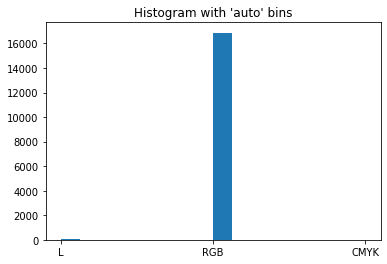

In [ ]:
import matplotlib.pyplot as plt

_ = plt.hist(data_for_bands, bins='auto')
plt.title("Histogram with 'auto' bins")
plt.show()

Bands: RGB (#images=16875)
File name: data/original_vertical_steam_banners/1205800.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1205800/library_600x900.jpg


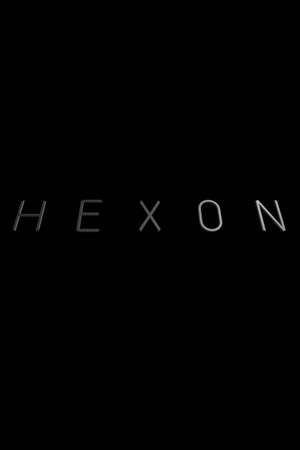

Bands: L (#images=40)
File name: data/original_vertical_steam_banners/1224130.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1224130/library_600x900.jpg


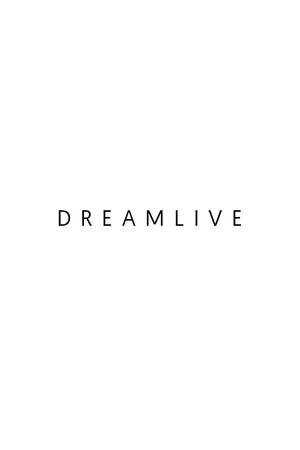

Bands: CMYK (#images=18)
File name: data/original_vertical_steam_banners/1432760.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1432760/library_600x900.jpg


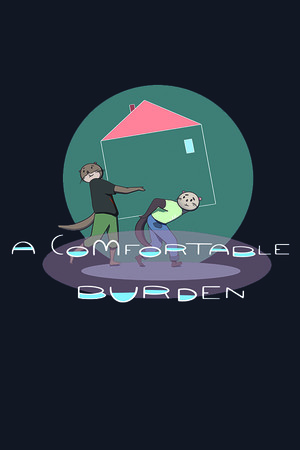

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

sorted_data = sorted(possible_band_combinations,
                     key=lambda x: counter[x],
                     reverse=True)

for channels_as_str in sorted_data:
  print('Bands: {} (#images={})'.format(channels_as_str, counter[channels_as_str]))

  f = next(i for i in file_names if d[i]['channels'] == channels_as_str)  
  print('File name: {}'.format(f))

  print(get_url(f))

  cv2_imshow(cv2.imread(f))

### Content area

In [ ]:
data_for_area = [
     e['area'] for e in d.values()
]

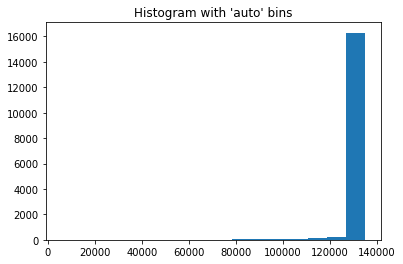

In [ ]:
import matplotlib.pyplot as plt

_ = plt.hist(data_for_area, bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

In [ ]:
import numpy as np

print(np.max(data_for_area))

theoretical_max_area = image_size[0] * image_size[1]
print(theoretical_max_area)

135000
135000


In [ ]:
np.count_nonzero([area<theoretical_max_area for area in data_for_area])

1105

Area at least 121500.0 (ratio: 0.90)
File name: data/original_vertical_steam_banners/1235440.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1235440/library_600x900.jpg


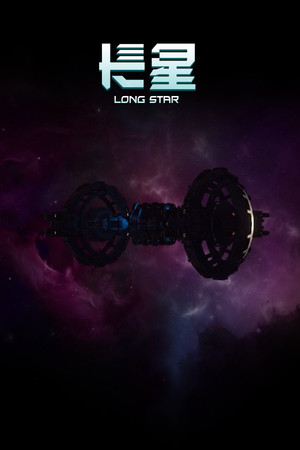

Area at least 122850.0 (ratio: 0.91)
File name: data/original_vertical_steam_banners/1273530.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1273530/library_600x900.jpg


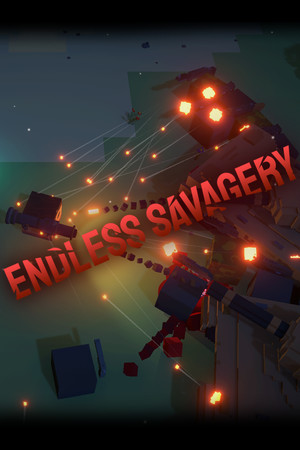

Area at least 124200.0 (ratio: 0.92)
File name: data/original_vertical_steam_banners/1432620.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1432620/library_600x900.jpg


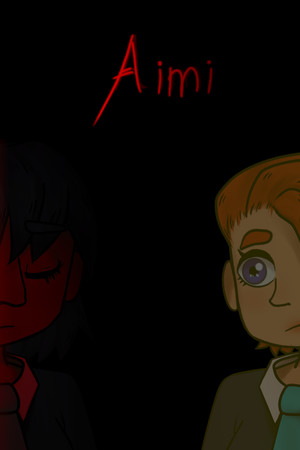

Area at least 125550.0 (ratio: 0.93)
File name: data/original_vertical_steam_banners/1235140.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1235140/library_600x900.jpg


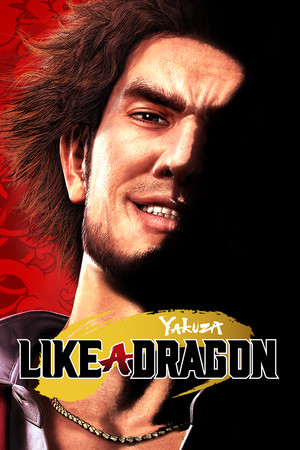

Area at least 126900.00000000001 (ratio: 0.94)
File name: data/original_vertical_steam_banners/342200.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/342200/library_600x900.jpg


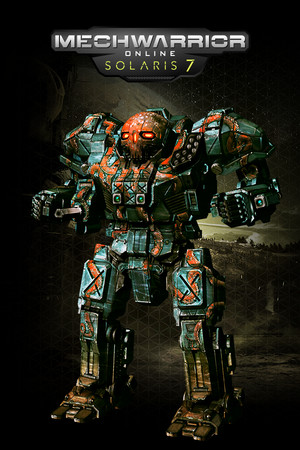

Area at least 128250.0 (ratio: 0.95)
File name: data/original_vertical_steam_banners/1407060.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1407060/library_600x900.jpg


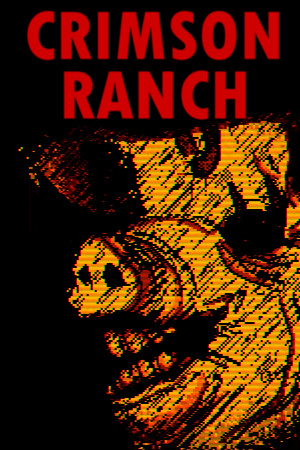

Area at least 129600.0 (ratio: 0.96)
File name: data/original_vertical_steam_banners/317300.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/317300/library_600x900.jpg


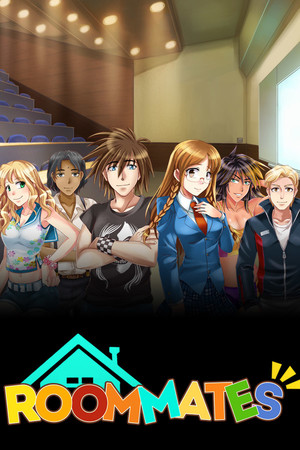

Area at least 130950.0 (ratio: 0.97)
File name: data/original_vertical_steam_banners/1378660.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1378660/library_600x900.jpg


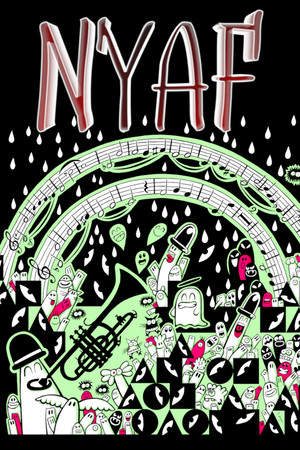

Area at least 132300.0 (ratio: 0.98)
File name: data/original_vertical_steam_banners/1197530.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1197530/library_600x900.jpg


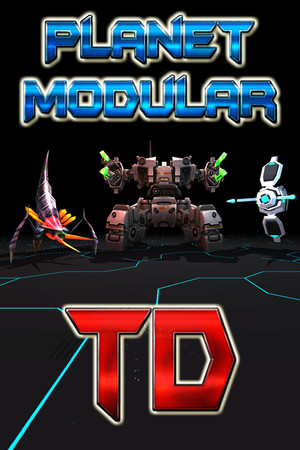

Area at least 133650.0 (ratio: 0.99)
File name: data/original_vertical_steam_banners/1150420.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1150420/library_600x900.jpg


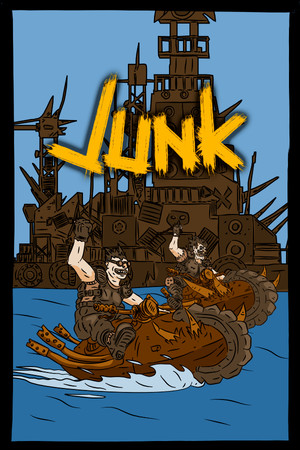

Area at least 135000.0 (ratio: 1.00)
File name: data/original_vertical_steam_banners/1431750.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1431750/library_600x900.jpg


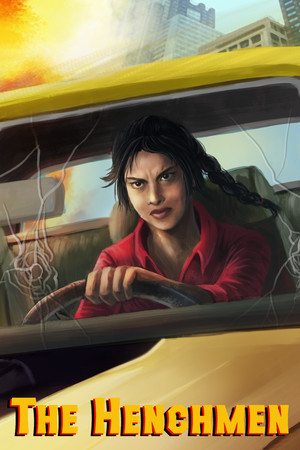

In [ ]:
import numpy as np

import cv2
from google.colab.patches import cv2_imshow

area_min_ratio = 0.9
area_max_ratio = 1
num_points = 11

for area_ratio in np.linspace(area_min_ratio,
                              area_max_ratio,
                              num_points):
  current_area = area_ratio * theoretical_max_area
  next_area = current_area + theoretical_max_area * (area_max_ratio-area_min_ratio)/num_points

  print('Area at least {} (ratio: {:.2f})'.format(current_area,
                                                  area_ratio))

  f = np.random.choice([i for i in file_names 
                        if d[i]['area'] >= current_area and d[i]['area'] < next_area
                        ])
  print('File name: {}'.format(f))

  print(get_url(f))

  cv2_imshow(cv2.imread(f))

### Filter

In [ ]:
app_ids_with_wrong_bands = [
                              get_app_id(f) for f in file_names 
                              if d[f]['channels'] != most_common_band
                              ]

print('#appIDs with uncommon bands (other than {}): {}'.format(most_common_band,
                                                               len(app_ids_with_wrong_bands),
                                                               ))

app_ids_with_area_too_small = [
                             get_app_id(f) for f in file_names
                             if d[f]['area'] != theoretical_max_area     
                             ]

print('#appIDs with non-maximal area ({}): {}'.format(theoretical_max_area,
                                              len(app_ids_with_area_too_small),
                                              ))

#appIDs with uncommon bands (other than RGB): 58
#appIDs with non-maximal area (135000): 1105


### Remove

In [ ]:
%cd /content/

/content


In [ ]:
folder_other = 'wrong_bands_or_area'

!mkdir -p {folder_other}

In [ ]:
app_ids_to_remove = set(app_ids_with_wrong_bands).union(app_ids_with_area_too_small)
len(app_ids_to_remove)

1151

In [ ]:
from pathlib import Path
import shutil

for f in file_names:
  app_id = get_app_id(f)

  if app_id in app_ids_to_remove:

    input_file_name = f
    output_file_name = folder_other + '/' + str(app_id) + '.jpg'

    if Path(input_file_name).exists():
      shutil.move(input_file_name, output_file_name)

In [ ]:
fname = folder_other + '.txt'

save_app_ids_to_file(fname,
                     image_dir=folder_other)

#appIDs = 1151


## 2. Identify and remove duplicates

Reference: https://idealo.github.io/imagededup/user_guide/finding_duplicates/

In [ ]:
file_names = list_file_names()

len(file_names)

15782

### Encode

**Caveat**: if images are PNG, the `CNN` method of this library returns an error.

In [ ]:
from imagededup.methods import PHash

encoder = PHash()

In [ ]:
image_dir = get_local_data_folder()

# Generate encodings for all images in an image directory
encodings = encoder.encode_images(image_dir=image_dir)

2020-10-11 19:52:56,615: INFO Start: Calculating hashes...
100%|██████████| 15782/15782 [01:03<00:00, 249.92it/s]
2020-10-11 19:53:59,870: INFO End: Calculating hashes!


### Find

In [ ]:
max_distance_threshold = 0
save_file_name = 'duplicates_{}.json'.format(max_distance_threshold)

# Find duplicates using the generated encodings
duplicates = encoder.find_duplicates(encoding_map=encodings,
                                     max_distance_threshold = max_distance_threshold,
                                     outfile = save_file_name)

files_with_duplicates = [f for f in duplicates.keys() if len(duplicates[f])>0]

files_with_duplicates = sorted(files_with_duplicates,
                               key=lambda x: len(duplicates[x]),
                               )

print('#files with at least one duplicate: {}'.format(len(files_with_duplicates)))

2020-10-11 19:53:59,885: INFO Start: Evaluating hamming distances for getting duplicates
2020-10-11 19:53:59,886: INFO Start: Retrieving duplicates using Cython Brute force algorithm
100%|██████████| 15782/15782 [00:01<00:00, 9957.65it/s] 
2020-10-11 19:54:01,605: INFO End: Retrieving duplicates using Cython Brute force algorithm
2020-10-11 19:54:01,606: INFO End: Evaluating hamming distances for getting duplicates
2020-10-11 19:54:01,614: INFO Start: Saving duplicates as json!
2020-10-11 19:54:01,660: INFO End: Saving duplicates as json!


#files with at least one duplicate: 98


In [ ]:
file_names_of_duplicates = encoder.find_duplicates_to_remove(
    encoding_map=encodings,
    max_distance_threshold = max_distance_threshold,
    )

print('#files to be removed: {}'.format(len(file_names_of_duplicates)))

2020-10-11 19:54:01,675: INFO Start: Evaluating hamming distances for getting duplicates
2020-10-11 19:54:01,676: INFO Start: Retrieving duplicates using Cython Brute force algorithm
100%|██████████| 15782/15782 [00:01<00:00, 10573.72it/s]
2020-10-11 19:54:03,347: INFO End: Retrieving duplicates using Cython Brute force algorithm
2020-10-11 19:54:03,348: INFO End: Evaluating hamming distances for getting duplicates


#files to be removed: 55


### Display

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (15, 10)

Index n°-1
#duplicates = 6 for appID = 1231800.jpg (https://cdn.cloudflare.steamstatic.com/steam/apps/1231800/library_600x900.jpg)


/usr/local/lib/python3.6/dist-packages/imagededup/utils/plotter.py:66: UserWarning: tight_layout: falling back to Agg renderer
  gs.tight_layout(fig)


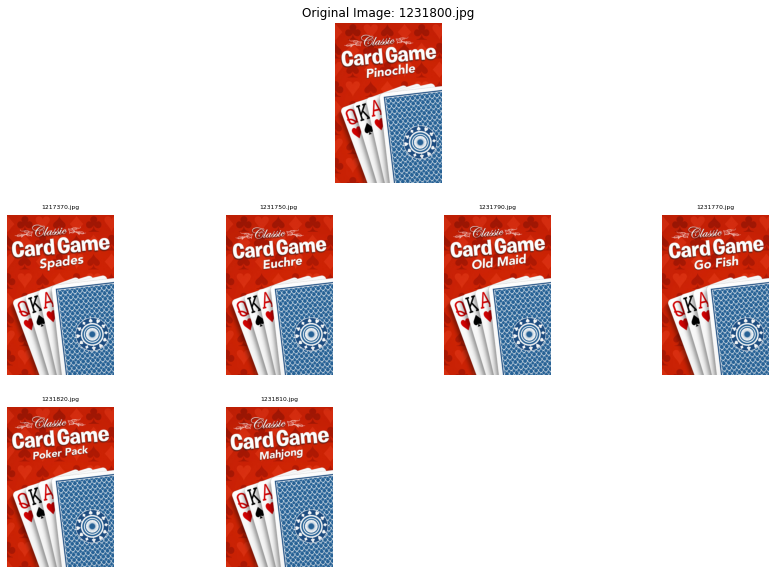

https://cdn.cloudflare.steamstatic.com/steam/apps/1231800/library_600x900.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1217370/library_600x900.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1231750/library_600x900.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1231790/library_600x900.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1231770/library_600x900.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1231820/library_600x900.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1231810/library_600x900.jpg


In [ ]:
import random
from imagededup.utils import plot_duplicates

# test_file_name_index = random.randint(0, len(files_with_duplicates))
test_file_name_index = -1

print('Index n°{}'.format(test_file_name_index))
test_file_name = files_with_duplicates[test_file_name_index]

num_duplicates = len(duplicates[test_file_name])

print('#duplicates = {} for appID = {} ({})'.format(
    num_duplicates,
    test_file_name,
    get_url(test_file_name),
    ))

threshold = 20
if num_duplicates <= threshold:
  plot_duplicates(image_dir=image_dir,
                  duplicate_map=duplicates,
                  filename=test_file_name)
  
  print(get_url(test_file_name))
  for f in duplicates[test_file_name]:
    print(get_url(f))
else:
  print('Too many duplicates ({} > {}).'.format(num_duplicates, threshold))

### Remove duplicate files

In [ ]:
%cd /content/

/content


In [ ]:
folder_other = 'duplicates'

!mkdir -p {folder_other}

In [ ]:
len(file_names_of_duplicates)

55

In [ ]:
from pathlib import Path
import shutil

for f in file_names_of_duplicates:
  app_id = get_app_id(f)

  input_file_name = image_dir + f
  output_file_name = folder_other + '/' + str(app_id) + get_image_extension()
  
  if Path(input_file_name).exists():
    shutil.move(input_file_name, output_file_name)  

In [ ]:
fname = folder_other + '.txt'

save_app_ids_to_file(fname,
                     image_dir=folder_other)

#appIDs = 55


## 3. Identify and remove outliers (tiny or large files, in KB)

In [ ]:
file_names = list_file_names()

len(file_names)

15727

### Confidence interval

In [ ]:
from scipy import stats
import os

file_sizes = [os.path.getsize(f) for f in file_names]

summary = stats.describe(file_sizes)
print(summary)

DescribeResult(nobs=15727, minmax=(5310, 157701), mean=54993.93247281745, variance=351588965.5286969, skewness=0.23503452741603767, kurtosis=0.10006034080448245)


In [ ]:
# References https://en.wikipedia.org/wiki/Confidence_interval#Basic_steps
z = 1.645 # 90%
# z = 1.96 # 95%
# z = 2.576 # 99%

In [ ]:
import math

print('z = {}'.format(z))

lower_bound = summary.mean - z * math.sqrt(summary.variance)
upper_bound = summary.mean + z * math.sqrt(summary.variance)

print('Confidence interval (in KB): [ {:.2f} ; {:.2f} ]'.format(lower_bound/get_kb_size(), upper_bound/get_kb_size()))

file_names_with_outlier_file_size = [
                                      f for f in file_names
                                      if os.path.getsize(f) < lower_bound or os.path.getsize(f) > upper_bound
]

print('#files to remove: {} (because file sizes are outliers)'.format(len(file_names_with_outlier_file_size)))

z = 1.645
Confidence interval (in KB): [ 23.58 ; 83.83 ]
#files to remove: 1551 (because file sizes are outliers)


### Display histogram

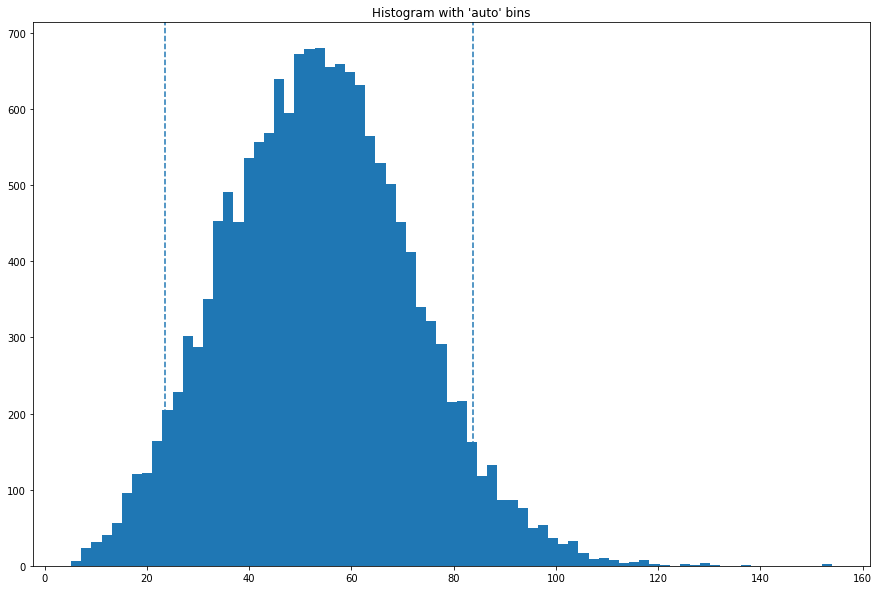

In [ ]:
import matplotlib.pyplot as plt

file_sizes_in_kb = [i/get_kb_size() for i in file_sizes]

_ = plt.hist(file_sizes_in_kb, bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")

plt.axvline(x=lower_bound/get_kb_size(), linestyle='--')
plt.axvline(x=upper_bound/get_kb_size(), linestyle='--')

plt.show()

### Information about tiny and large files (in KB)

Tiny or large files are **not** removed based on the following percentiles.

In [ ]:
min_size = stats.scoreatpercentile(file_sizes, per=0.1)
print('{:.2f} KB'.format(min_size/get_kb_size()))

8.39 KB


In [ ]:
max_size = stats.scoreatpercentile(file_sizes, per=99.9)
print('{:.2f} KB'.format(max_size/get_kb_size()))

117.44 KB


In [ ]:
file_names_with_uncommon_file_size = [
                                      f for f in file_names
                                      if os.path.getsize(f) < min_size or os.path.getsize(f) > max_size
]

In [ ]:
len(file_names_with_uncommon_file_size)

32

File size: 5.185546875 KB
File name: data/original_vertical_steam_banners/1085280.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1085280/library_600x900.jpg


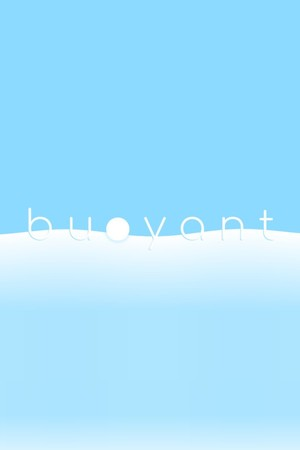

File size: 5.5498046875 KB
File name: data/original_vertical_steam_banners/1225920.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1225920/library_600x900.jpg


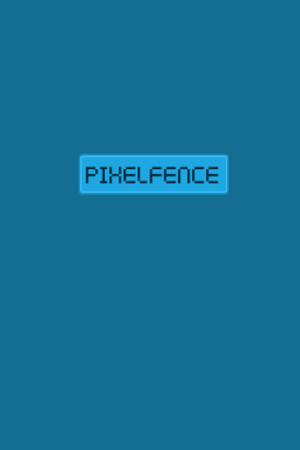

File size: 5.7314453125 KB
File name: data/original_vertical_steam_banners/1377980.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1377980/library_600x900.jpg


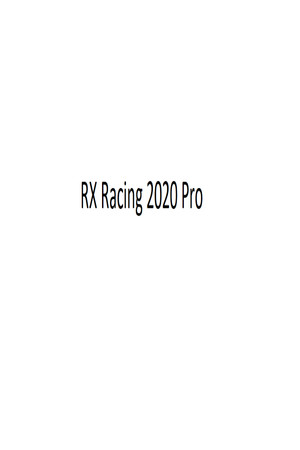

File size: 5.9921875 KB
File name: data/original_vertical_steam_banners/1409630.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1409630/library_600x900.jpg


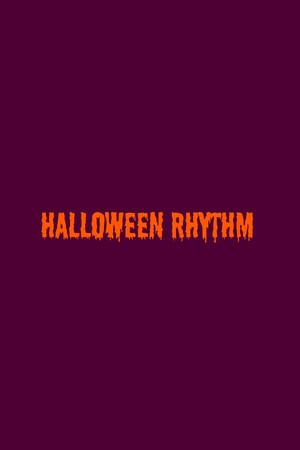

File size: 6.619140625 KB
File name: data/original_vertical_steam_banners/1095360.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1095360/library_600x900.jpg


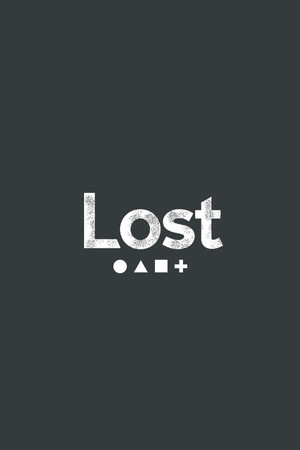

File size: 7.046875 KB
File name: data/original_vertical_steam_banners/1378350.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1378350/library_600x900.jpg


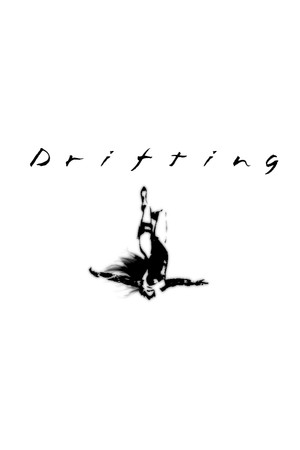

File size: 7.443359375 KB
File name: data/original_vertical_steam_banners/765940.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/765940/library_600x900.jpg


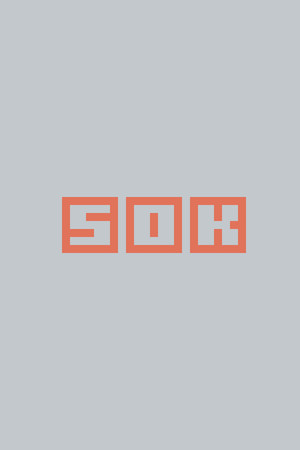

File size: 7.515625 KB
File name: data/original_vertical_steam_banners/786820.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/786820/library_600x900.jpg


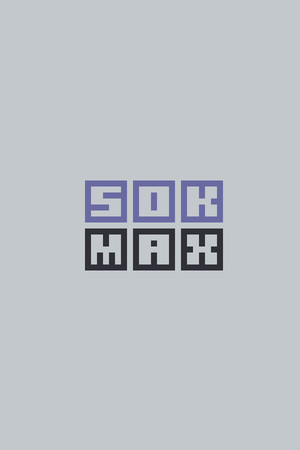

File size: 7.6357421875 KB
File name: data/original_vertical_steam_banners/1375270.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1375270/library_600x900.jpg


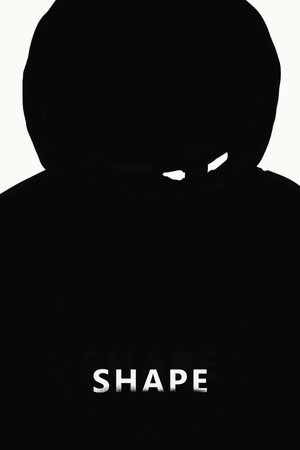

File size: 7.6591796875 KB
File name: data/original_vertical_steam_banners/1221330.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1221330/library_600x900.jpg


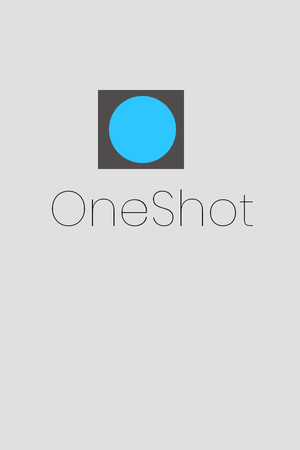

File size: 7.79296875 KB
File name: data/original_vertical_steam_banners/1395250.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1395250/library_600x900.jpg


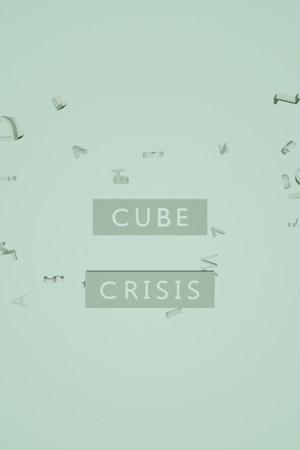

File size: 7.9150390625 KB
File name: data/original_vertical_steam_banners/857590.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/857590/library_600x900.jpg


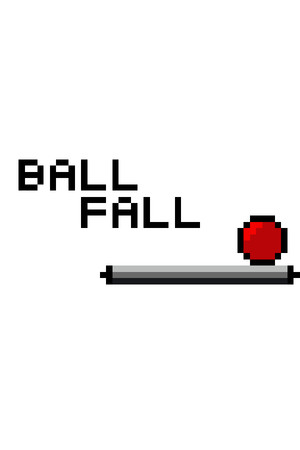

File size: 7.9443359375 KB
File name: data/original_vertical_steam_banners/1009240.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1009240/library_600x900.jpg


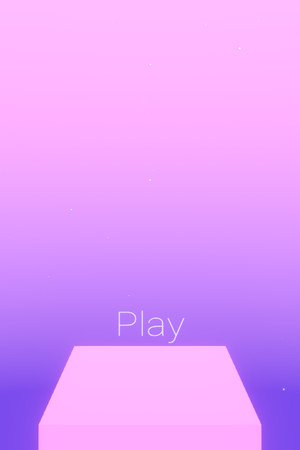

File size: 8.080078125 KB
File name: data/original_vertical_steam_banners/1296880.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1296880/library_600x900.jpg


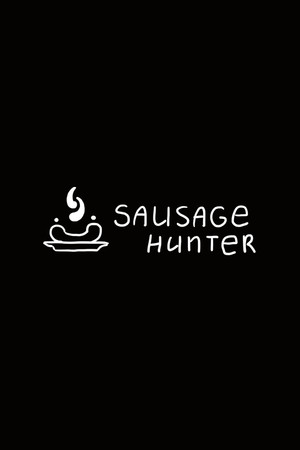

File size: 8.1513671875 KB
File name: data/original_vertical_steam_banners/1370550.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1370550/library_600x900.jpg


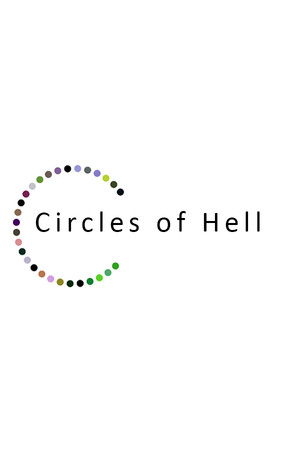

File size: 8.189453125 KB
File name: data/original_vertical_steam_banners/1216600.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1216600/library_600x900.jpg


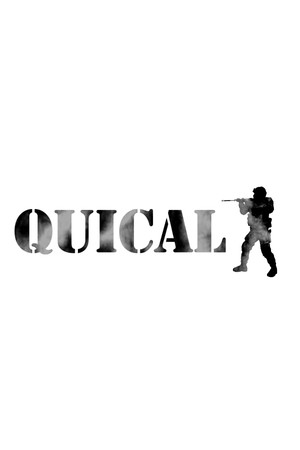

File size: 117.5927734375 KB
File name: data/original_vertical_steam_banners/1399400.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1399400/library_600x900.jpg


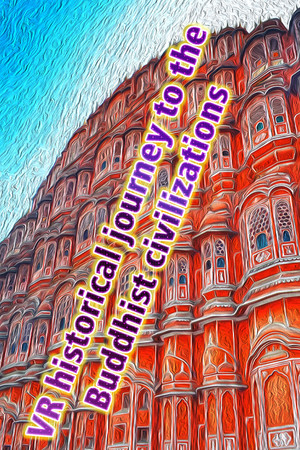

File size: 117.9287109375 KB
File name: data/original_vertical_steam_banners/1385820.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1385820/library_600x900.jpg


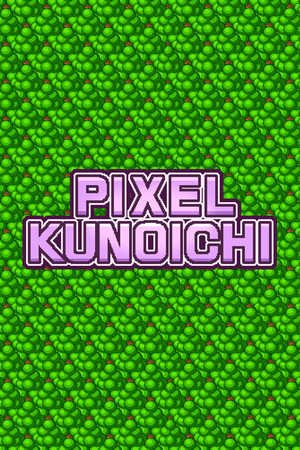

File size: 118.61328125 KB
File name: data/original_vertical_steam_banners/1104630.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1104630/library_600x900.jpg


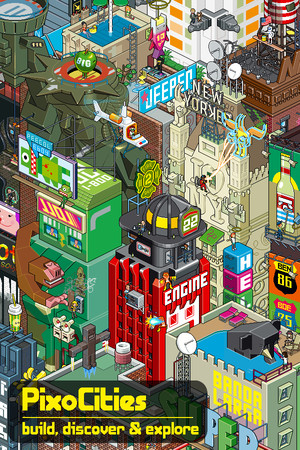

File size: 118.6181640625 KB
File name: data/original_vertical_steam_banners/1026400.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1026400/library_600x900.jpg


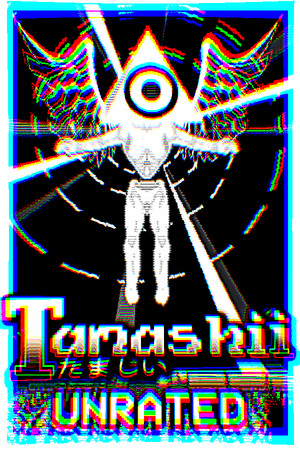

File size: 121.8544921875 KB
File name: data/original_vertical_steam_banners/1131960.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1131960/library_600x900.jpg


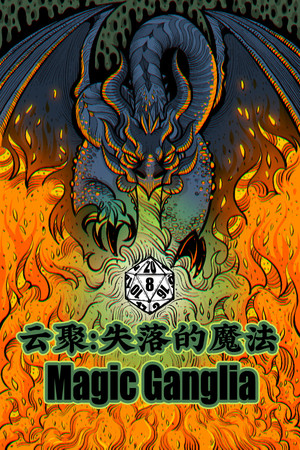

File size: 125.9130859375 KB
File name: data/original_vertical_steam_banners/1319270.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1319270/library_600x900.jpg


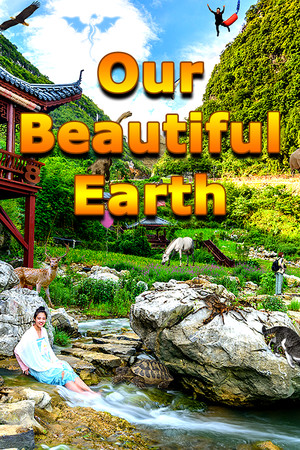

File size: 126.03515625 KB
File name: data/original_vertical_steam_banners/725330.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/725330/library_600x900.jpg


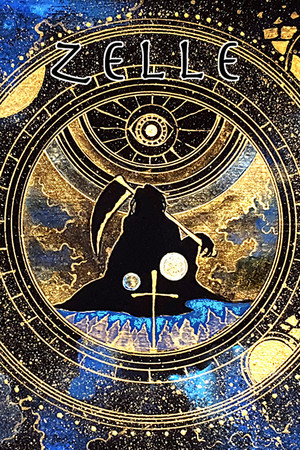

File size: 128.0390625 KB
File name: data/original_vertical_steam_banners/536690.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/536690/library_600x900.jpg


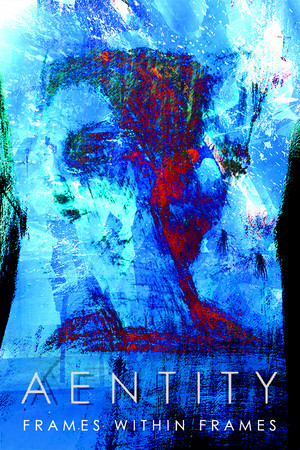

File size: 128.6640625 KB
File name: data/original_vertical_steam_banners/1272100.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1272100/library_600x900.jpg


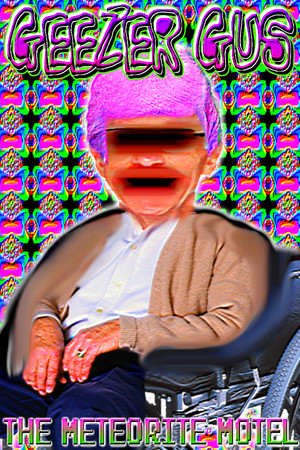

File size: 128.8232421875 KB
File name: data/original_vertical_steam_banners/500670.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/500670/library_600x900.jpg


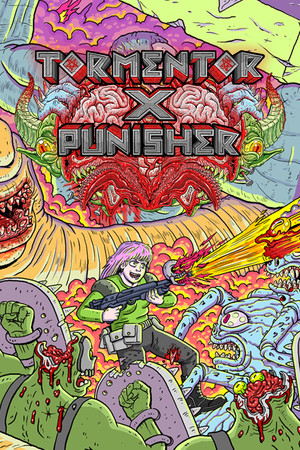

File size: 128.9990234375 KB
File name: data/original_vertical_steam_banners/1153750.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1153750/library_600x900.jpg


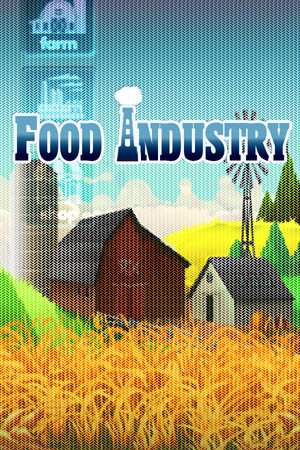

File size: 129.7421875 KB
File name: data/original_vertical_steam_banners/485080.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/485080/library_600x900.jpg


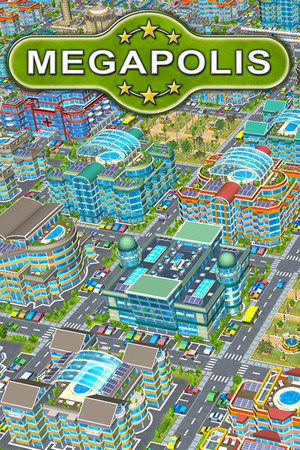

File size: 131.7001953125 KB
File name: data/original_vertical_steam_banners/1109310.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1109310/library_600x900.jpg


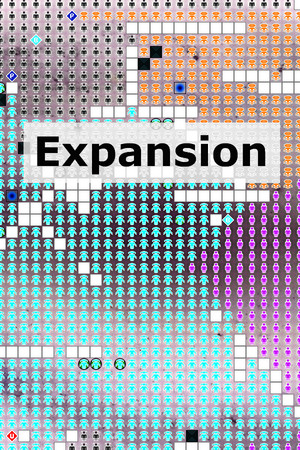

File size: 137.81640625 KB
File name: data/original_vertical_steam_banners/945490.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/945490/library_600x900.jpg


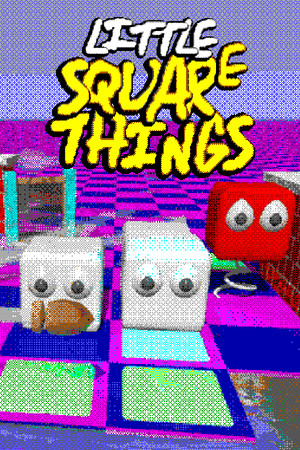

File size: 153.5625 KB
File name: data/original_vertical_steam_banners/375290.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/375290/library_600x900.jpg


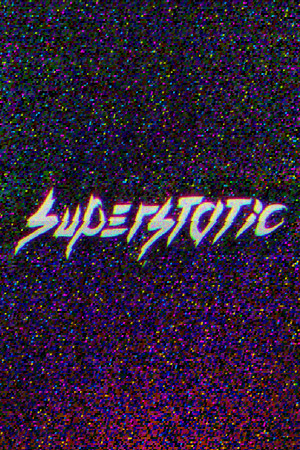

File size: 154.0048828125 KB
File name: data/original_vertical_steam_banners/1269400.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1269400/library_600x900.jpg


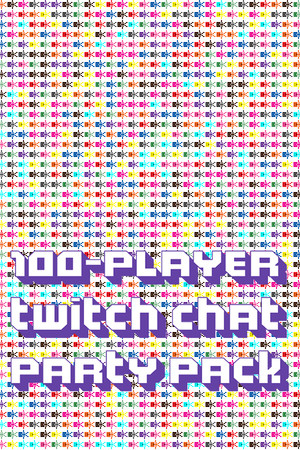

In [ ]:
import os

import cv2
from google.colab.patches import cv2_imshow

for f in file_names_with_uncommon_file_size:
  score = os.path.getsize(f)
  
  print('File size: {} KB'.format(score/get_kb_size()))
  print('File name: {}'.format(f))
  print(get_url(f))
  cv2_imshow(cv2.imread(f))

### Display images for each percentile

Percentile: 0%
File size: 5.185546875 KB
File name: data/original_vertical_steam_banners/1225920.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1225920/library_600x900.jpg


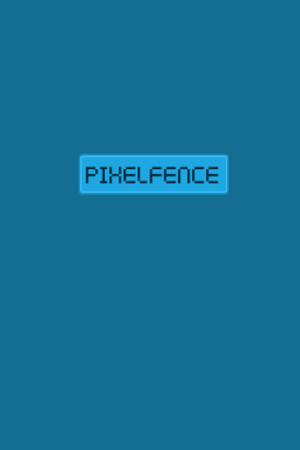

Percentile: 5%
File size: 24.28076171875 KB
File name: data/original_vertical_steam_banners/1042380.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1042380/library_600x900.jpg


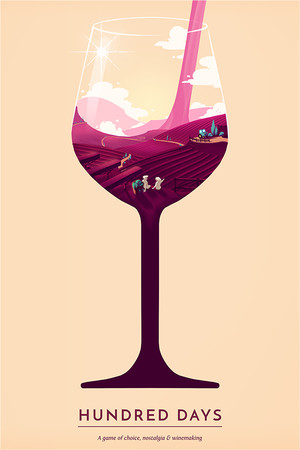

Percentile: 10%
File size: 30.265625 KB
File name: data/original_vertical_steam_banners/404080.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/404080/library_600x900.jpg


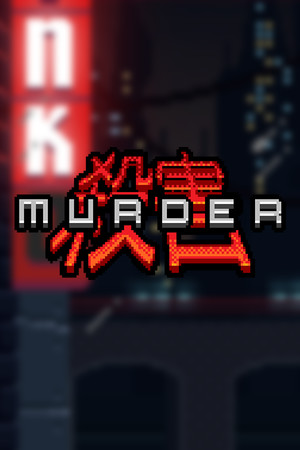

Percentile: 15%
File size: 34.44814453125 KB
File name: data/original_vertical_steam_banners/1422580.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1422580/library_600x900.jpg


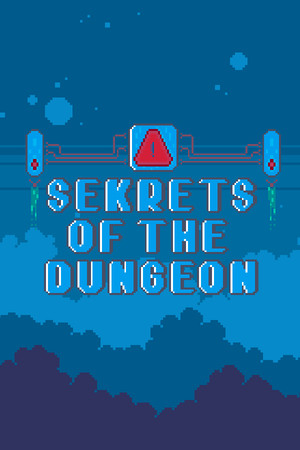

Percentile: 20%
File size: 37.75703125 KB
File name: data/original_vertical_steam_banners/1385590.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1385590/library_600x900.jpg


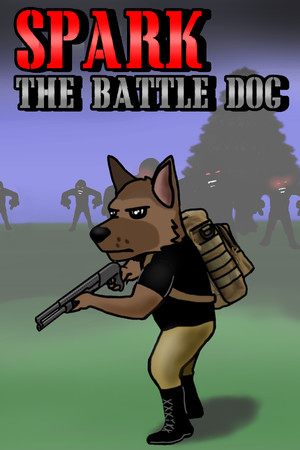

Percentile: 25%
File size: 40.779296875 KB
File name: data/original_vertical_steam_banners/662410.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/662410/library_600x900.jpg


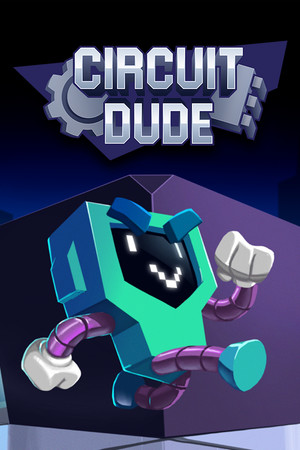

Percentile: 30%
File size: 43.603515625 KB
File name: data/original_vertical_steam_banners/1356470.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1356470/library_600x900.jpg


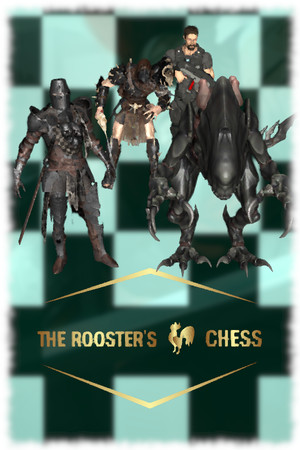

Percentile: 35%
File size: 46.190625000000004 KB
File name: data/original_vertical_steam_banners/719130.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/719130/library_600x900.jpg


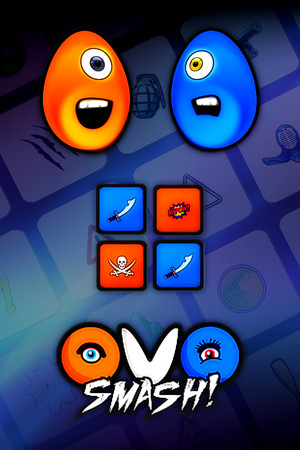

Percentile: 40%
File size: 48.718945312500004 KB
File name: data/original_vertical_steam_banners/759570.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/759570/library_600x900.jpg


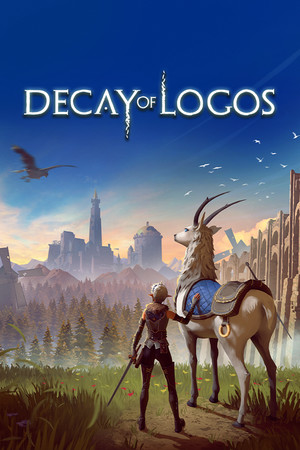

Percentile: 45%
File size: 51.066796875 KB
File name: data/original_vertical_steam_banners/1003090.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1003090/library_600x900.jpg


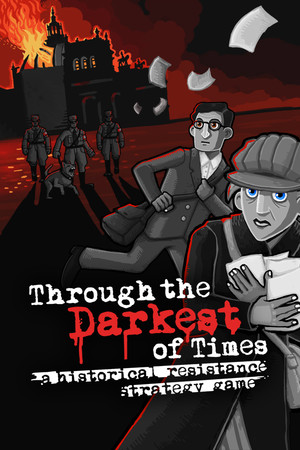

Percentile: 50%
File size: 53.3154296875 KB
File name: data/original_vertical_steam_banners/951430.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/951430/library_600x900.jpg


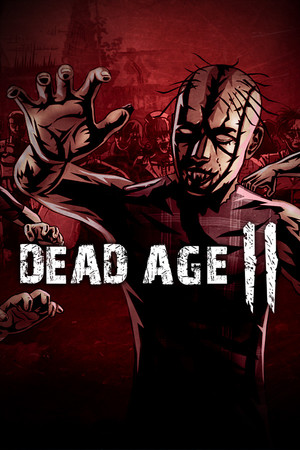

Percentile: 55%
File size: 55.667578125000006 KB
File name: data/original_vertical_steam_banners/299440.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/299440/library_600x900.jpg


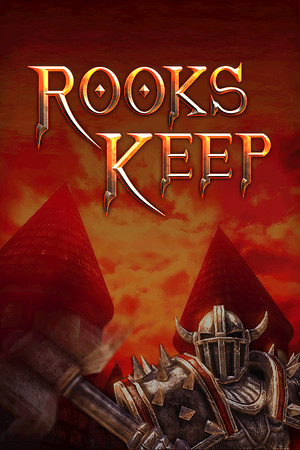

Percentile: 60%
File size: 58.117968749999996 KB
File name: data/original_vertical_steam_banners/397160.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/397160/library_600x900.jpg


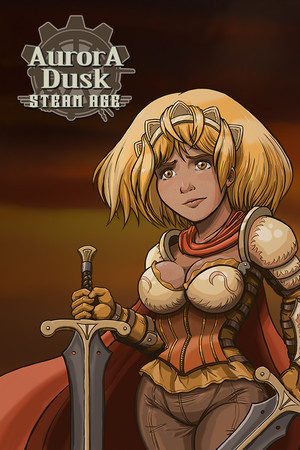

Percentile: 65%
File size: 60.432421874999996 KB
File name: data/original_vertical_steam_banners/292860.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/292860/library_600x900.jpg


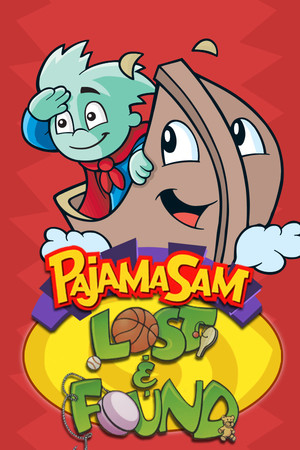

Percentile: 70%
File size: 62.911914062499996 KB
File name: data/original_vertical_steam_banners/605830.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/605830/library_600x900.jpg


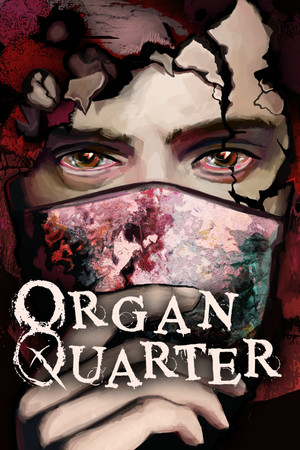

Percentile: 75%
File size: 65.80126953125 KB
File name: data/original_vertical_steam_banners/1301820.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1301820/library_600x900.jpg


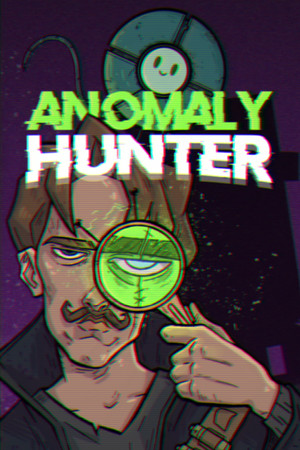

Percentile: 80%
File size: 68.87421875000001 KB
File name: data/original_vertical_steam_banners/440640.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/440640/library_600x900.jpg


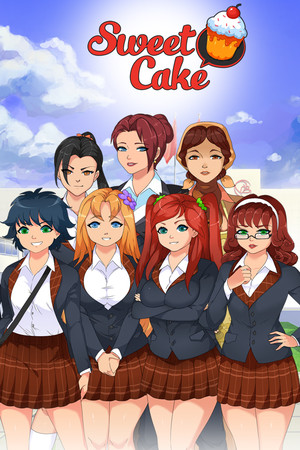

Percentile: 85%
File size: 72.48447265625 KB
File name: data/original_vertical_steam_banners/403100.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/403100/library_600x900.jpg


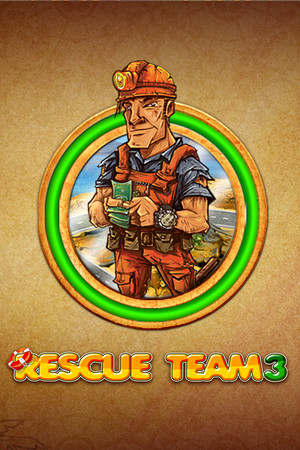

Percentile: 90%
File size: 77.214453125 KB
File name: data/original_vertical_steam_banners/1219930.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1219930/library_600x900.jpg


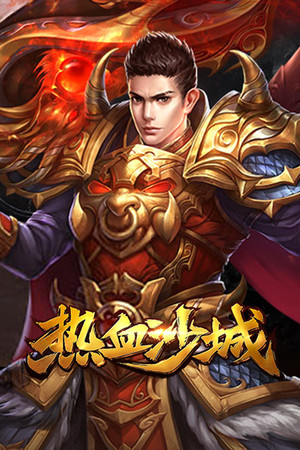

Percentile: 95%
File size: 84.39726562499996 KB
File name: data/original_vertical_steam_banners/1045120.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1045120/library_600x900.jpg


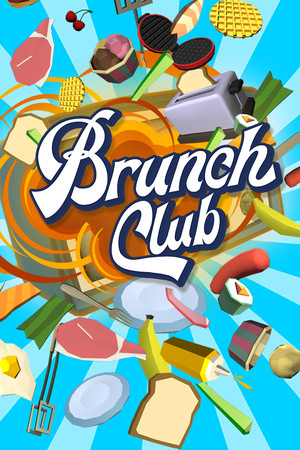

In [ ]:
for percentile in range(0, 100, 5):
  show_image_for_percentile(file_sizes, percentile)

### Display low percentiles

Percentile: 0.0%
File size: 5.185546875 KB
File name: data/original_vertical_steam_banners/1225920.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1225920/library_600x900.jpg


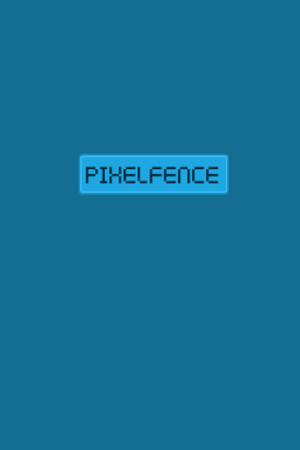

Percentile: 0.5555555555555556%
File size: 12.564127604166668 KB
File name: data/original_vertical_steam_banners/666330.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/666330/library_600x900.jpg


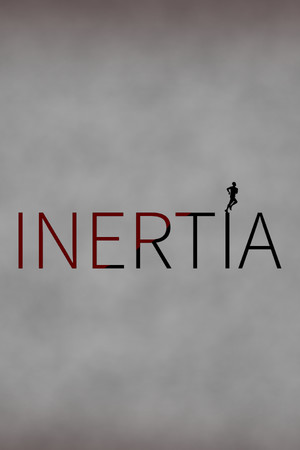

Percentile: 1.1111111111111112%
File size: 15.518294270833334 KB
File name: data/original_vertical_steam_banners/1430320.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1430320/library_600x900.jpg


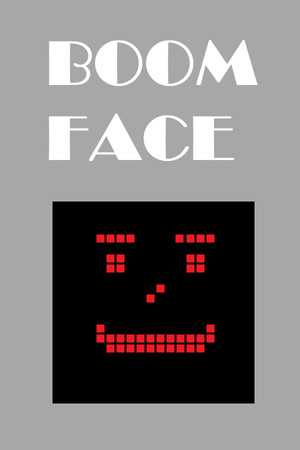

Percentile: 1.6666666666666667%
File size: 17.381933593750002 KB
File name: data/original_vertical_steam_banners/731670.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/731670/library_600x900.jpg


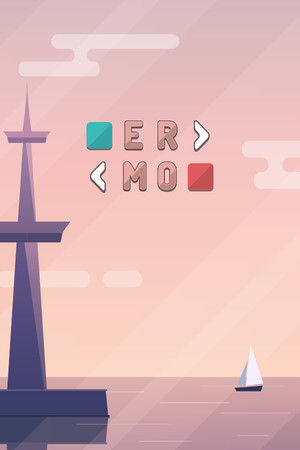

Percentile: 2.2222222222222223%
File size: 18.659635416666667 KB
File name: data/original_vertical_steam_banners/1010070.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1010070/library_600x900.jpg


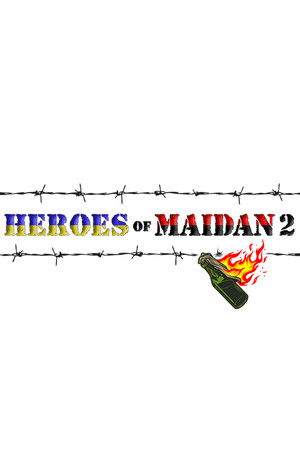

Percentile: 2.7777777777777777%
File size: 20.270833333333332 KB
File name: data/original_vertical_steam_banners/1019060.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1019060/library_600x900.jpg


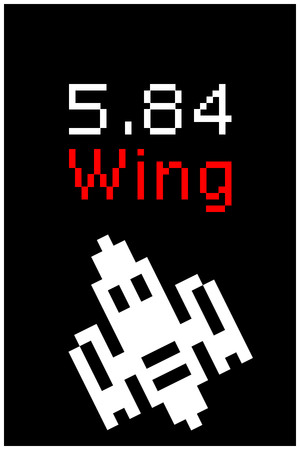

Percentile: 3.3333333333333335%
File size: 21.5228515625 KB
File name: data/original_vertical_steam_banners/1119800.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1119800/library_600x900.jpg


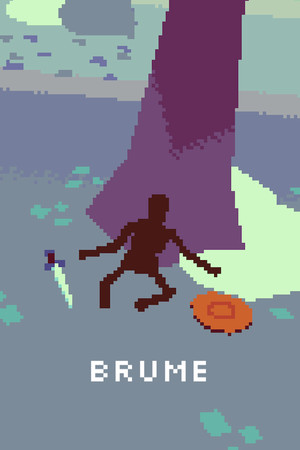

Percentile: 3.8888888888888893%
File size: 22.50426432291667 KB
File name: data/original_vertical_steam_banners/757860.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/757860/library_600x900.jpg


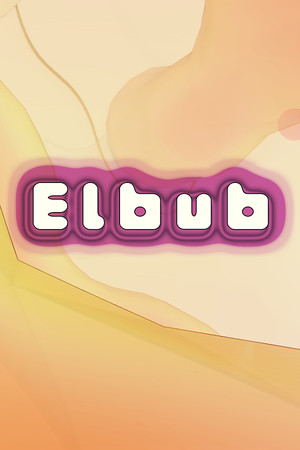

Percentile: 4.444444444444445%
File size: 23.404752604166667 KB
File name: data/original_vertical_steam_banners/935750.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/935750/library_600x900.jpg


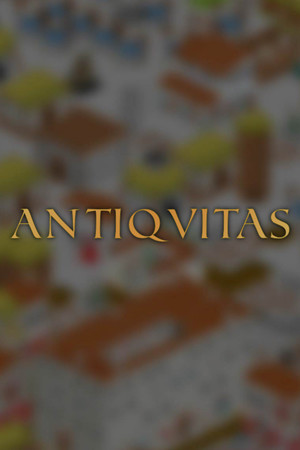

Percentile: 5.0%
File size: 24.28076171875 KB
File name: data/original_vertical_steam_banners/1042380.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1042380/library_600x900.jpg


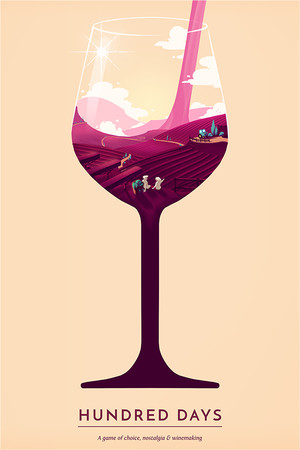

In [ ]:
import numpy as np

for percentile in np.linspace(0, 5, 10):
  show_image_for_percentile(file_sizes, percentile)

### Display high percentiles

Percentile: 95.0%
File size: 84.39726562499996 KB
File name: data/original_vertical_steam_banners/1045120.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1045120/library_600x900.jpg


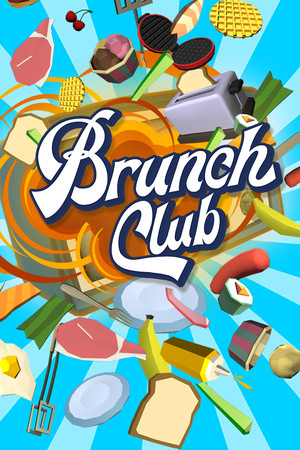

Percentile: 95.55544444444445%
File size: 85.71516427734377 KB
File name: data/original_vertical_steam_banners/1261990.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1261990/library_600x900.jpg


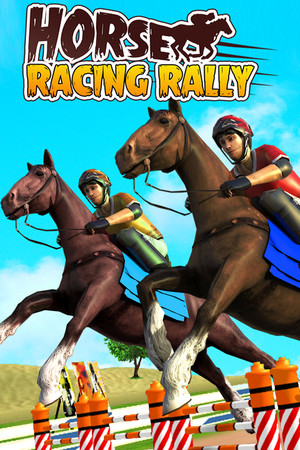

Percentile: 96.1108888888889%
File size: 87.06033265625001 KB
File name: data/original_vertical_steam_banners/1229380.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1229380/library_600x900.jpg


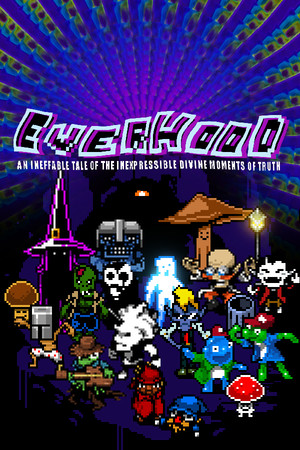

Percentile: 96.66633333333333%
File size: 88.48041203124998 KB
File name: data/original_vertical_steam_banners/1147390.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1147390/library_600x900.jpg


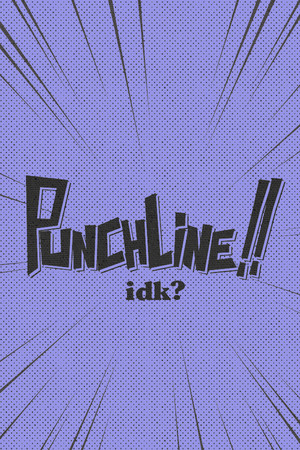

Percentile: 97.22177777777777%
File size: 90.50595388020832 KB
File name: data/original_vertical_steam_banners/469990.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/469990/library_600x900.jpg


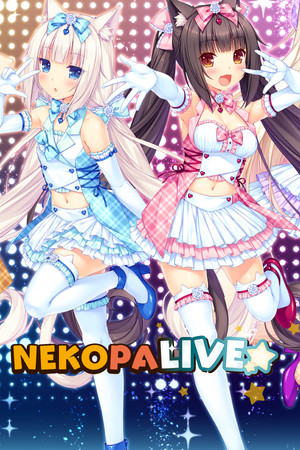

Percentile: 97.77722222222222%
File size: 92.49371848958334 KB
File name: data/original_vertical_steam_banners/1248590.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1248590/library_600x900.jpg


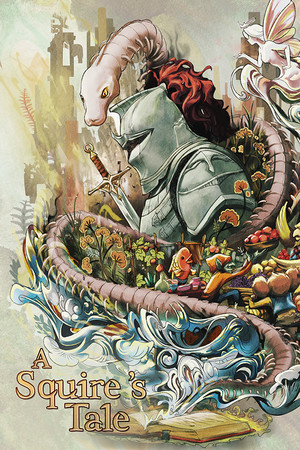

Percentile: 98.33266666666667%
File size: 94.96856093749999 KB
File name: data/original_vertical_steam_banners/946770.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/946770/library_600x900.jpg


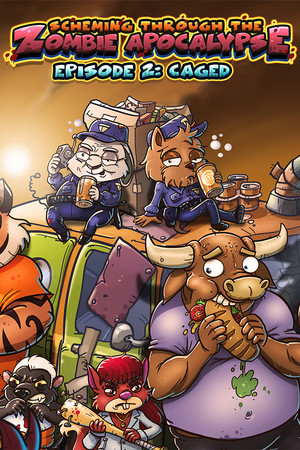

Percentile: 98.8881111111111%
File size: 98.12566615885402 KB
File name: data/original_vertical_steam_banners/1309910.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1309910/library_600x900.jpg


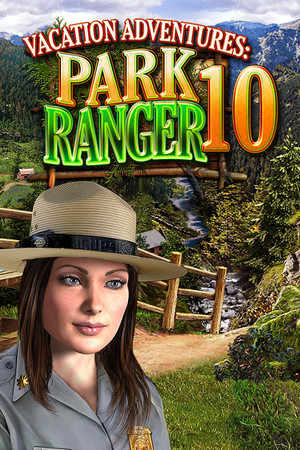

Percentile: 99.44355555555555%
File size: 103.3666803125 KB
File name: data/original_vertical_steam_banners/982400.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/982400/library_600x900.jpg


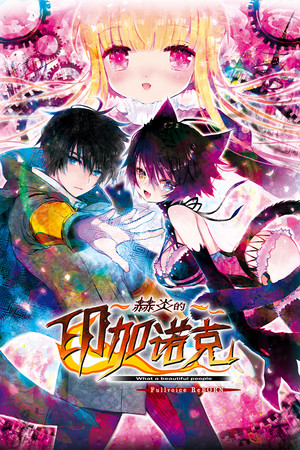

Percentile: 99.999%
File size: 153.93531369140547 KB
File name: data/original_vertical_steam_banners/1269400.jpg
https://cdn.cloudflare.steamstatic.com/steam/apps/1269400/library_600x900.jpg


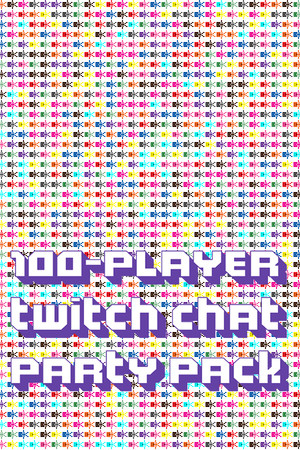

In [ ]:
import numpy as np

for percentile in np.linspace(95, 99.999, 10):
  show_image_for_percentile(file_sizes, percentile)

### Remove

**Caveat**: tiny or large files are removed based on the confidence interval.

In [ ]:
%cd /content/

/content


In [ ]:
folder_other = 'outliers'

!mkdir -p {folder_other}

In [ ]:
len(file_names_with_outlier_file_size)

1551

In [ ]:
from pathlib import Path
import shutil

for f in file_names_with_outlier_file_size:
  app_id = get_app_id(f)

  input_file_name = f
  output_file_name = folder_other + '/' + str(app_id) + get_image_extension()
  
  if Path(input_file_name).exists():
    shutil.move(input_file_name, output_file_name)  

In [ ]:
fname = folder_other + '.txt'

save_app_ids_to_file(fname,
                     image_dir=folder_other)

#appIDs = 1551


## Export the filtered archive

In [ ]:
file_names = list_file_names()

len(file_names)

14176

In [ ]:
local_data_folder = get_local_data_folder()

In [ ]:
!echo tar cf {output_archive_name} {local_data_folder}
!tar cf {output_archive_name} {local_data_folder}

tar cf filtered_vertical_steam_banners.tar data/original_vertical_steam_banners/


In [ ]:
!du -sh {output_archive_name}

747M	filtered_vertical_steam_banners.tar


In [ ]:
colab_transfer.copy_file(output_archive_name,
                         source = lm,
                         destination = gd + get_gdrive_data_folder())

Copying /content/filtered_vertical_steam_banners.tar to /content/drive/My Drive/data/filtered_vertical_steam_banners.tar


## Resize images to 256x256

In [ ]:
!apt-get install imagemagick

In [162]:
%cd /content/
%mkdir -p data/{output_resized_folder}

In [158]:
file_extension = get_image_extension()

In [165]:
!mogrify \
-resize '256x256!' \
-path /content/data/{output_resized_folder} \
/content/{local_data_folder}*{file_extension}

## Export the resized archive

In [172]:
file_names = list_file_names(image_dir='data/' + output_resized_folder)

len(file_names)

14176

In [169]:
output_resized_archive_name = output_resized_folder + '.tar'

!echo tar cf {output_resized_archive_name} data/{output_resized_folder}
!tar cf {output_resized_archive_name} data/{output_resized_folder}

tar cf resized_vertical_steam_banners.tar data/resized_vertical_steam_banners


In [170]:
!du -sh {output_resized_archive_name}

417M	resized_vertical_steam_banners.tar


In [171]:
colab_transfer.copy_file(output_resized_archive_name,
                         source = lm,
                         destination = gd + get_gdrive_data_folder())

Copying /content/resized_vertical_steam_banners.tar to /content/drive/My Drive/data/resized_vertical_steam_banners.tar
